In [1]:
pip install pycocotools opencv-python numpy tqdm albumentations

In [2]:
!mkdir coco
!cd coco && wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip
!cd coco && wget http://images.cocodataset.org/zips/train2017.zip
!cd coco && wget http://images.cocodataset.org/zips/val2017.zip
!cd coco && unzip annotations_trainval2017.zip
!cd coco && unzip train2017.zip
!cd coco && unzip val2017.zip


Streaming output truncated to the last 5000 lines.
 extracting: val2017/000000212226.jpg  
 extracting: val2017/000000231527.jpg  
 extracting: val2017/000000578922.jpg  
 extracting: val2017/000000062808.jpg  
 extracting: val2017/000000119038.jpg  
 extracting: val2017/000000114871.jpg  
 extracting: val2017/000000463918.jpg  
 extracting: val2017/000000365745.jpg  
 extracting: val2017/000000320425.jpg  
 extracting: val2017/000000481404.jpg  
 extracting: val2017/000000314294.jpg  
 extracting: val2017/000000335328.jpg  
 extracting: val2017/000000513688.jpg  
 extracting: val2017/000000158548.jpg  
 extracting: val2017/000000132116.jpg  
 extracting: val2017/000000415238.jpg  
 extracting: val2017/000000321333.jpg  
 extracting: val2017/000000081738.jpg  
 extracting: val2017/000000577584.jpg  
 extracting: val2017/000000346905.jpg  
 extracting: val2017/000000433980.jpg  
 extracting: val2017/000000228144.jpg  
 extracting: val2017/000000041872.jpg  
 extracting: val2017/00000011

In [3]:
!pip install albumentations==1.3.0


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.5/123.5 kB 4.9 MB/s eta 0:00:00
  Attempting uninstall: albumentations
    Found existing installation: albumentations 2.0.4
    Uninstalling albumentations-2.0.4:
      Successfully uninstalled albumentations-2.0.4


In [6]:
import os
from pycocotools.coco import COCO

# 📌 Step 1: Define paths (Update these paths)
coco_annotations_path = "/content/coco/annotations/instances_train2017.json"  # COCO annotation file

# 📌 Step 2: Load COCO Annotations
coco = COCO(coco_annotations_path)

# 📌 Step 3: Get Categories and Count Images Per Category
category_counts = {}

for cat in coco.loadCats(coco.getCatIds()):
    category_name = cat["name"]
    cat_id = cat["id"]

    # Get all image IDs for this category
    img_ids = coco.getImgIds(catIds=[cat_id])
    category_counts[category_name] = len(img_ids)

# 📌 Step 4: Print the Category Counts
print("📌 Number of Images Per Category:")
for category, count in category_counts.items():
    print(f"{category}: {count} images")


loading annotations into memory...
Done (t=28.02s)
creating index...
index created!
📌 Number of Images Per Category:
person: 64115 images
bicycle: 3252 images
car: 12251 images
motorcycle: 3502 images
airplane: 2986 images
bus: 3952 images
train: 3588 images
truck: 6127 images
boat: 3025 images
traffic light: 4139 images
fire hydrant: 1711 images
stop sign: 1734 images
parking meter: 705 images
bench: 5570 images
bird: 3237 images
cat: 4114 images
dog: 4385 images
horse: 2941 images
sheep: 1529 images
cow: 1968 images
elephant: 2143 images
bear: 960 images
zebra: 1916 images
giraffe: 2546 images
backpack: 5528 images
umbrella: 3968 images
handbag: 6841 images
tie: 3810 images
suitcase: 2402 images
frisbee: 2184 images
skis: 3082 images
snowboard: 1654 images
sports ball: 4262 images
kite: 2261 images
baseball bat: 2506 images
baseball glove: 2629 images
skateboard: 3476 images
surfboard: 3486 images
tennis racket: 3394 images
bottle: 8501 images
wine glass: 2533 images
cup: 9189 images

loading annotations into memory...
Done (t=33.94s)
creating index...
index created!
Saving examples for category: car


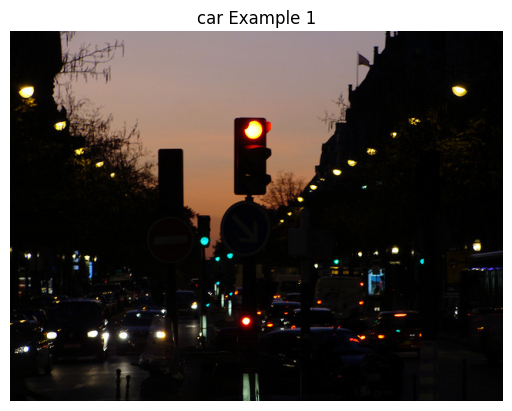

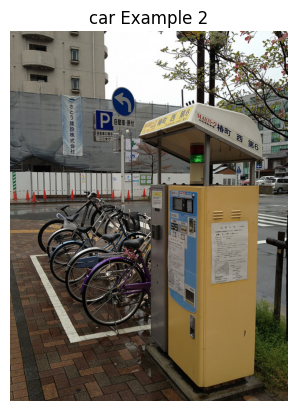

Saving examples for category: truck


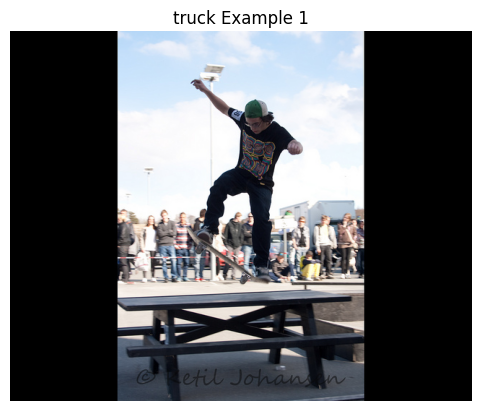

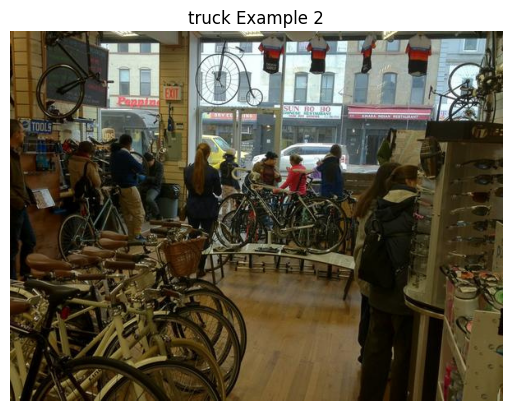

Saving examples for category: motorcycle


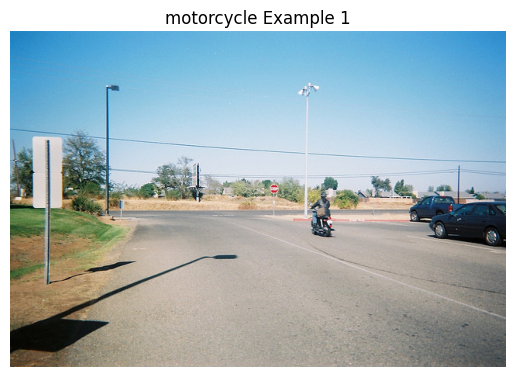

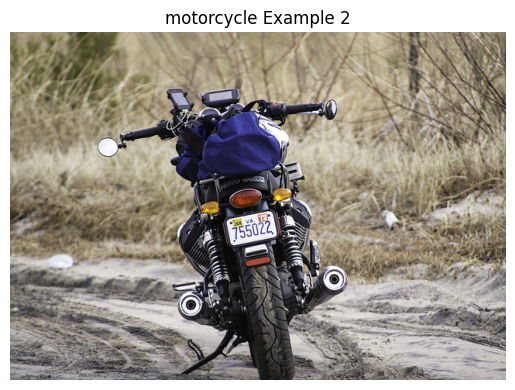

Saving examples for category: bus


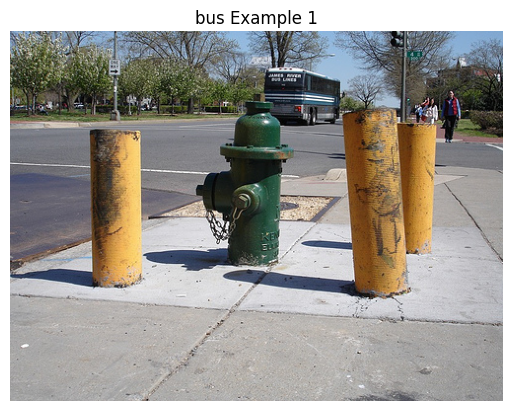

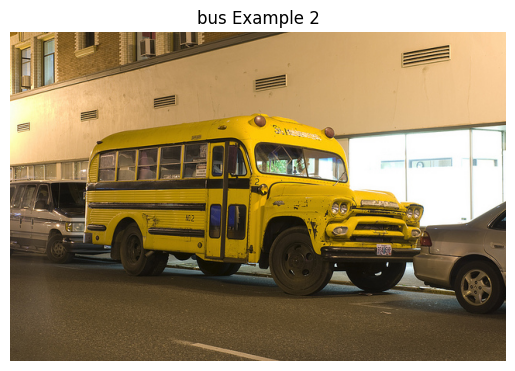

Saving examples for category: bicycle


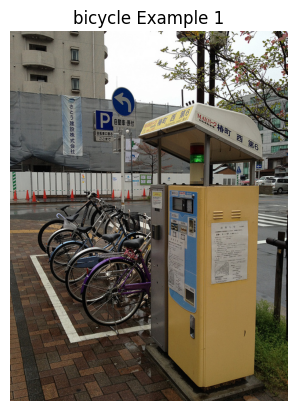

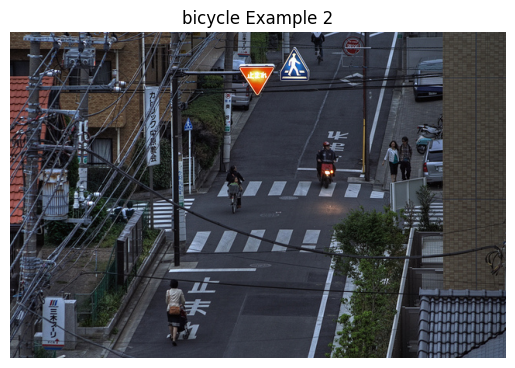

Saving examples for category: fire hydrant


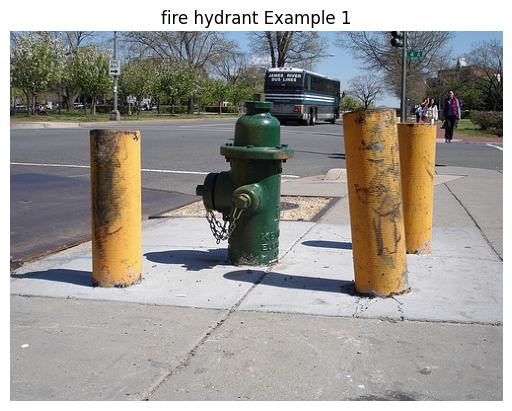

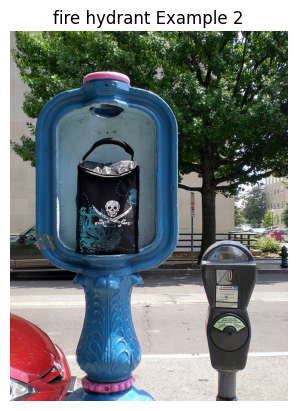

Saving examples for category: stop sign


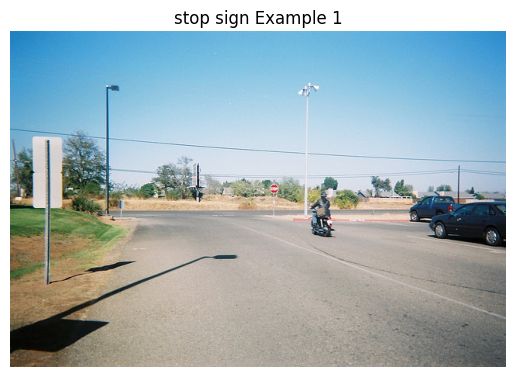

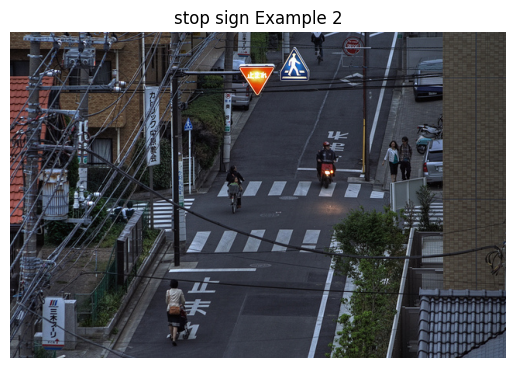

Saving examples for category: parking meter


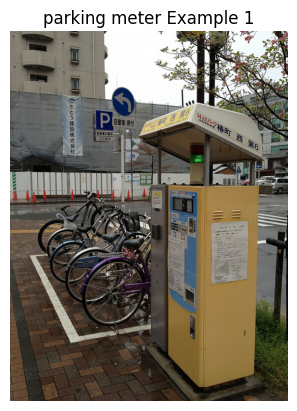

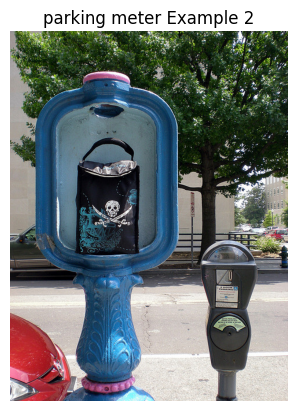

Saving examples for category: bench


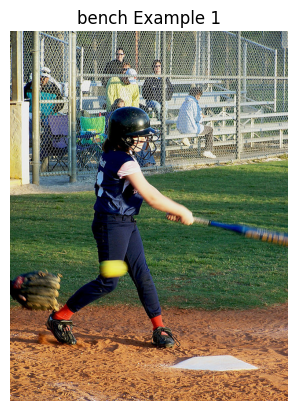

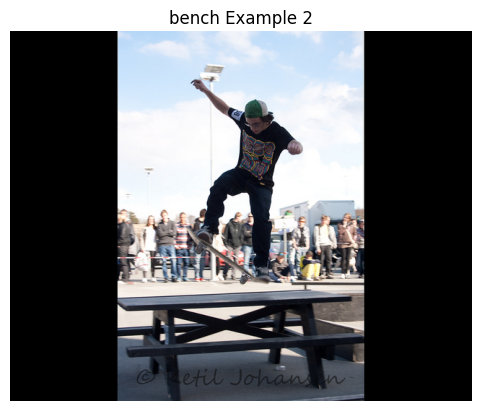

Saving examples for category: bird


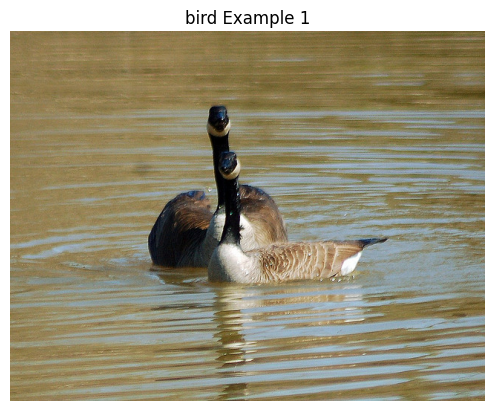

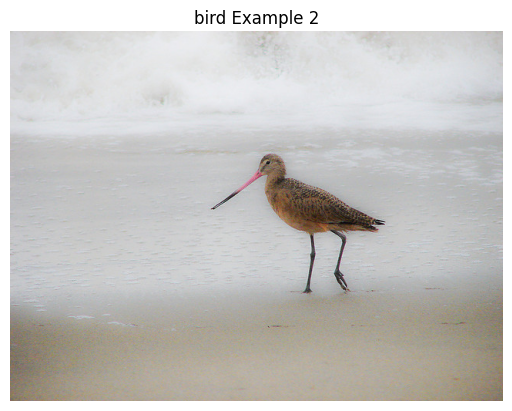

Saving examples for category: cat


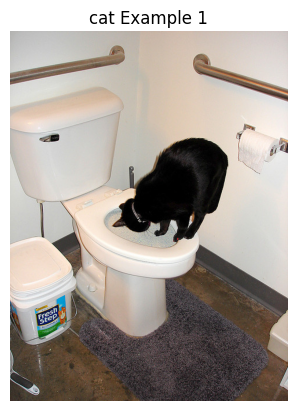

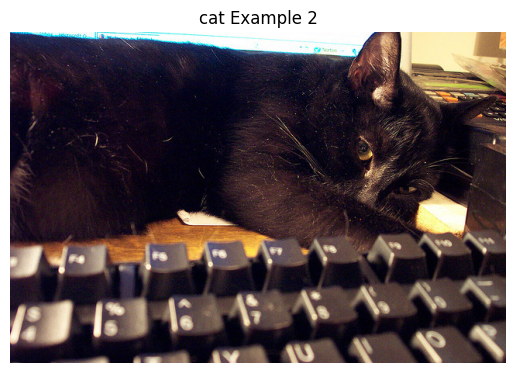

Saving examples for category: dog


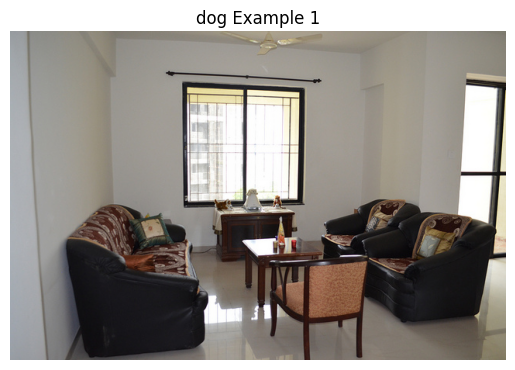

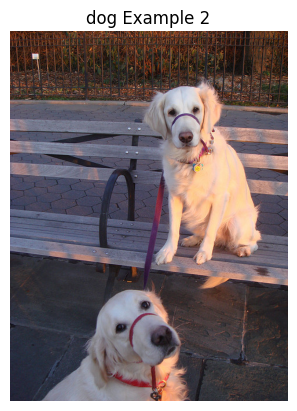

Saving examples for category: backpack


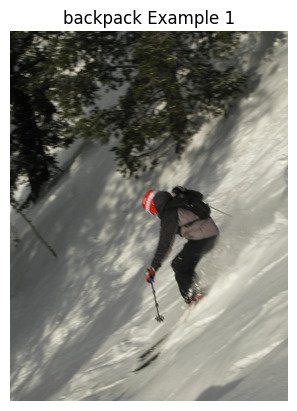

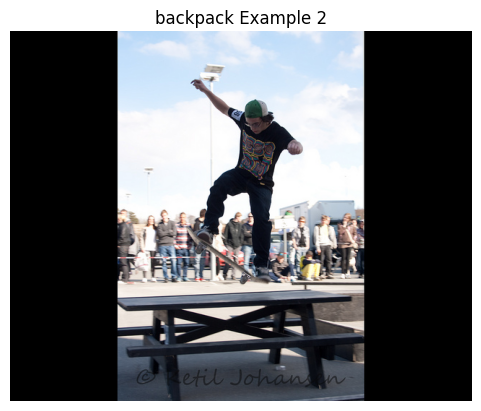

Saving examples for category: umbrella


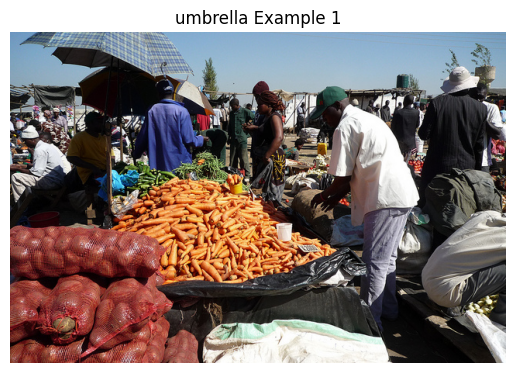

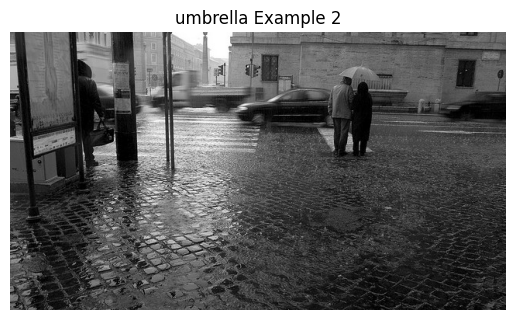

Saving examples for category: handbag


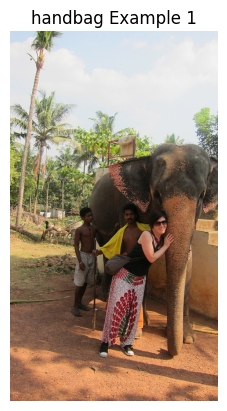

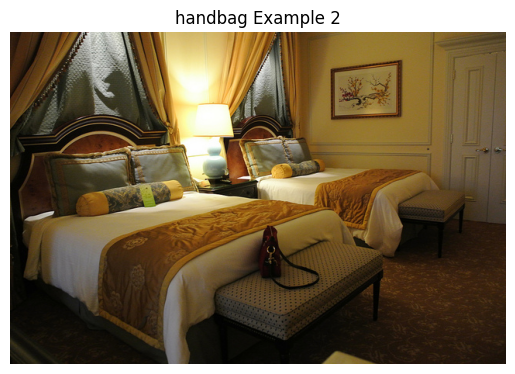

Saving examples for category: tie


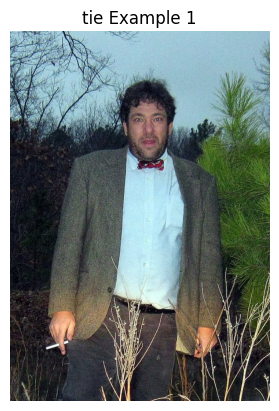

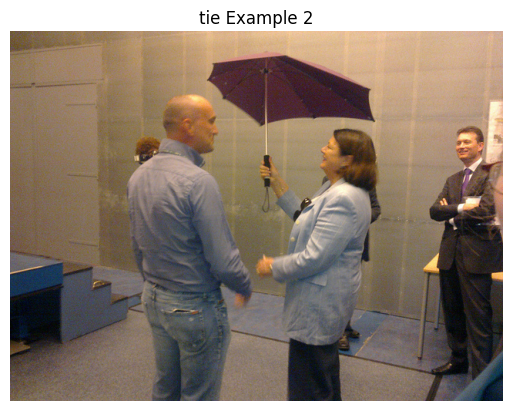

Saving examples for category: suitcase


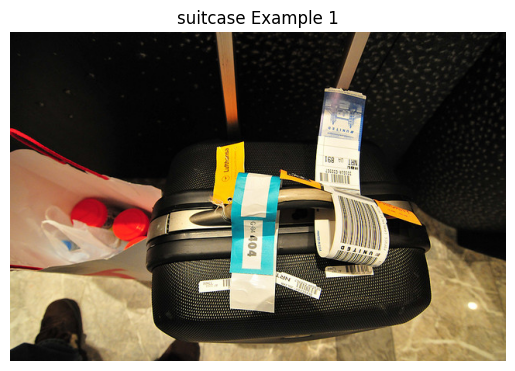

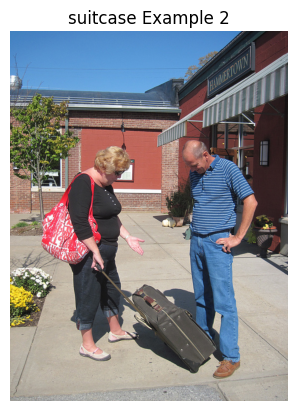

Saving examples for category: frisbee


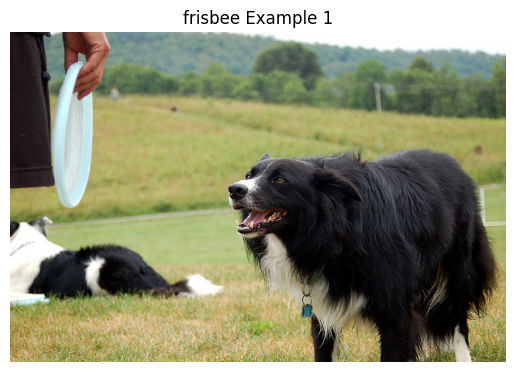

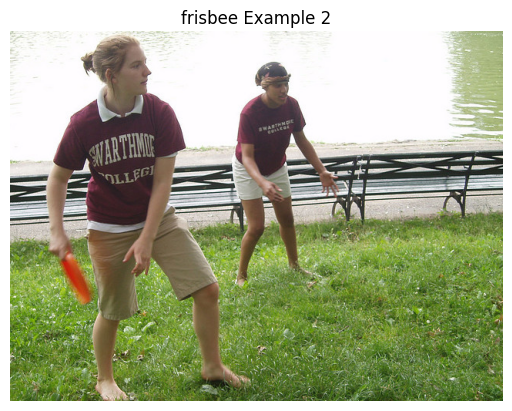

Saving examples for category: skis


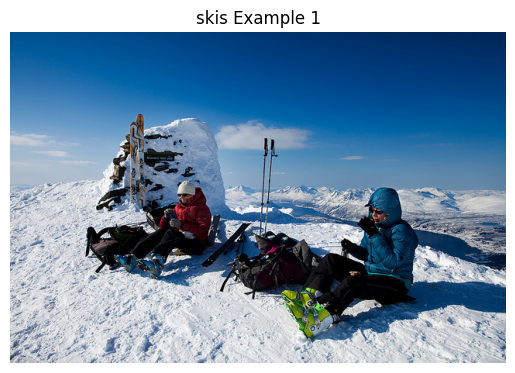

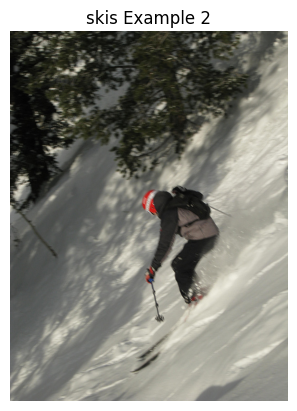

Saving examples for category: snowboard


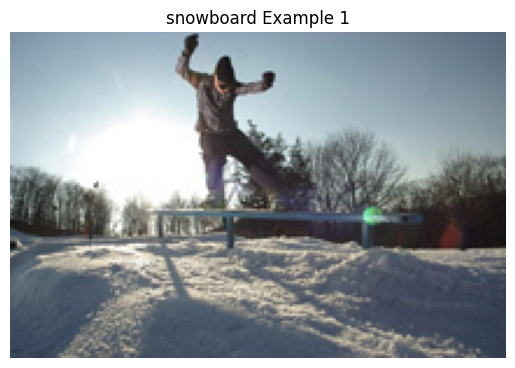

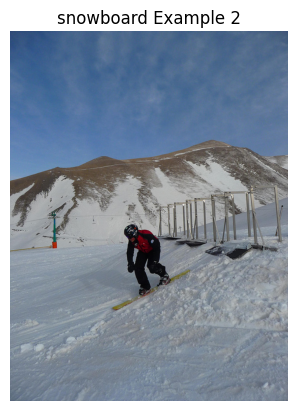

Saving examples for category: sports ball


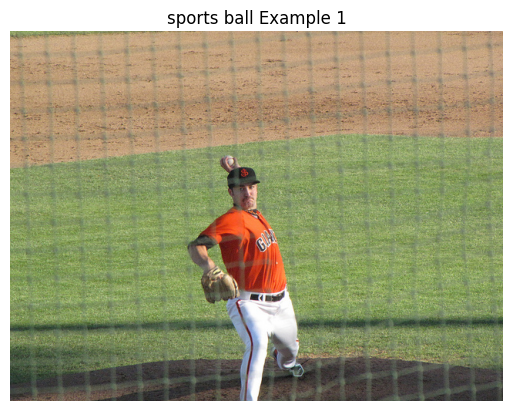

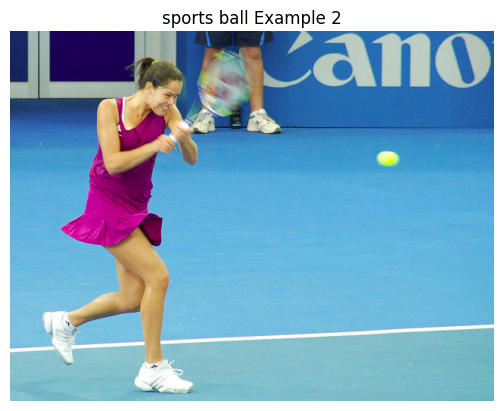

Saving examples for category: kite


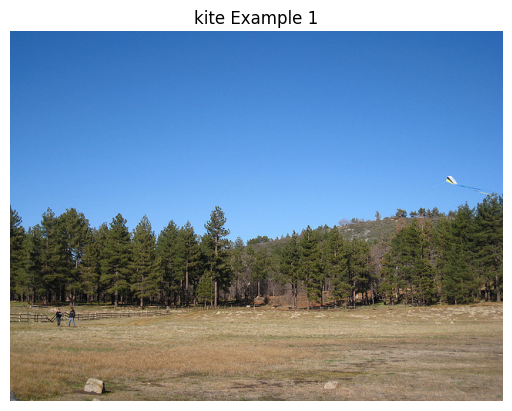

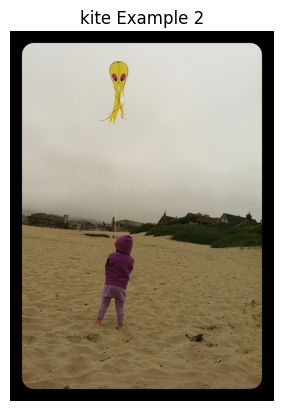

Saving examples for category: baseball bat


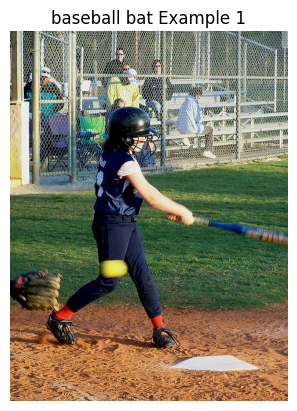

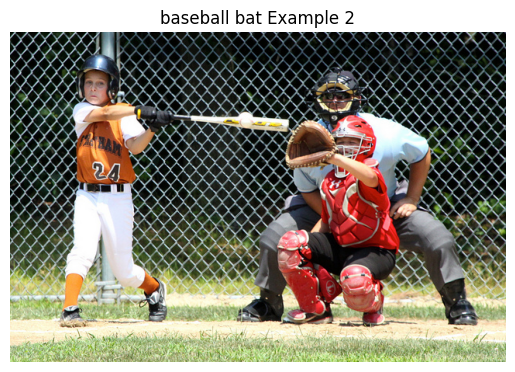

Saving examples for category: baseball glove


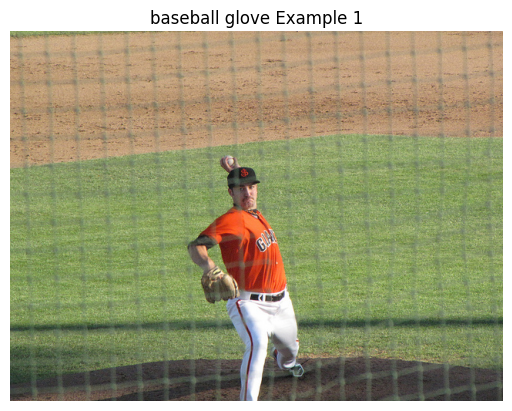

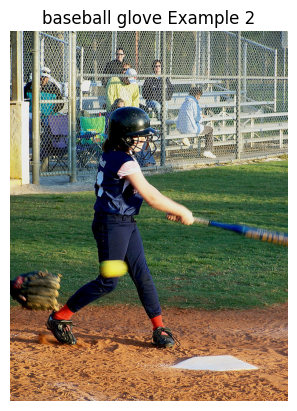

In [8]:
import os
import requests
from pycocotools.coco import COCO
import matplotlib.pyplot as plt
from PIL import Image

# 📌 Step 1: Define paths (Update these paths)
coco_images_path = "/content/coco/train2017/"  # Path where COCO images are stored
coco_annotations_path = "/content/coco/annotations/instances_train2017.json"  # COCO annotation file
save_path = "/content/save_examples/"  # Path to save example images

# Ensure save path exists
os.makedirs(save_path, exist_ok=True)

# 📌 Step 2: Load COCO Annotations
coco = COCO(coco_annotations_path)

# 📌 Step 3: Define Categories
vehicle_categories = ["car", "truck", "motorcycle", "bus", "bicycle"]
object_categories = ["fire hydrant", "stop sign", "parking meter", "bench"]
animal_categories = ["bird", "cat", "dog"]
balance_categories = [
    "backpack", "umbrella", "handbag", "tie", "suitcase", "frisbee",
    "skis", "snowboard", "sports ball", "kite", "baseball bat", "baseball glove",
    "skateboard", "surfboard", "tennis racket", "bottle", "wine glass", "cup"
]

# Combine all categories
all_categories = vehicle_categories + object_categories + animal_categories + balance_categories

# 📌 Step 4: Get Categories and Select Example Images
category_example_images = {}

for category_name in all_categories:
    cat_ids = coco.getCatIds(catNms=[category_name])

    # Get all image IDs for this category
    img_ids = coco.getImgIds(catIds=cat_ids)

    # Select 2 example images
    if len(img_ids) >= 2:
        category_example_images[category_name] = img_ids[:2]  # Take first 2 images

# 📌 Step 5: Save and Display Example Images
for category, img_ids in category_example_images.items():
    print(f"Saving examples for category: {category}")

    for i, img_id in enumerate(img_ids):
        img_info = coco.loadImgs(img_id)[0]
        img_filename = img_info["file_name"]  # Image filename

        # Define full path
        img_path = os.path.join(coco_images_path, img_filename)
        save_img_path = os.path.join(save_path, f"{category}_{i+1}.jpg")

        # Load and Save Image
        if os.path.exists(img_path):
            img = Image.open(img_path)
            img.save(save_img_path)
        else:
            # If file is not available locally, download it
            img_url = img_info["coco_url"]  # URL of the image
            img = Image.open(requests.get(img_url, stream=True).raw)
            img.save(save_img_path)

        # Display image
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"{category} Example {i+1}")
        plt.show()
